In [1]:
from bertgcn import *

/home/jeana/.local/lib/python3.8/site-packages/pandas/core/computation/expressions.py:20: UserWarning: Pandas requires version '2.7.3' or newer of 'numexpr' (version '2.7.1' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED


In [2]:
datafile = '20230208_Annotated_lang_filtered.csv'
version = 'v3'
dataset = 'tag_elec_' + version

bert_max_length = 128
bert_batch_size = 128
bert_nb_epochs = 10
bert_lr = 2e-5
bert_init = 'GKLMIP/bert-tagalog-base-uncased'
bert_checkpoint_dir = None
if checkpoint_dir is None:
    bert_ckpt_dir = './checkpoint/{}_{}'.format(bert_init, dataset)
else:
    bert_ckpt_dir = checkpoint_dir

In [8]:
dataset_prep(datafile, dataset, version)

[[0 1 0]
 [1 0 0]
 [0 0 1]
 ...
 [0 0 1]
 [0 0 1]
 [0 0 1]]
[[1 0 0]
 [0 0 1]
 [0 0 1]
 ...
 [0 0 1]
 [0 0 1]
 [0 0 1]]


In [3]:
finetune_bert(bert_max_length, bert_batch_size, nb_epochs, bert_lr, bert_init, bert_checkpoint_dir, bert_ckpt_dir, dataset)

checkpoints will be saved in ./checkpoint/GKLMIP/bert-tagalog-base-uncased_tag_elec_v3
(5785, 300) (5785, 3) (804, 300) (804, 3) (29651, 300) (29651, 3)
30455


Some weights of the model checkpoint at GKLMIP/bert-tagalog-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.predictions.decoder.bias', 'cls.predictions.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.decoder.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Epoch: 1  Train f1: 0.8277 loss: 0.4363  Val f1: 0.8039 loss: 0.4900  Test f1: 0.8092 loss: 0.4821
New checkpoint
Epoch: 2  Train f1: 0.8834 loss: 0.3080  Val f1: 0.8169 loss: 0.4528  Test f1: 0.8166 loss: 0.4531
New checkpoint
Epoch: 3  Train f1: 0.9324 loss: 0.2089  Val f1: 0.8189 loss: 0.4779  Test f1: 0.8327 loss: 0.4723
New checkpoint
Epoch: 4  Train f1: 0.9736 loss: 0.0991  Val f1: 0.8168 loss: 0.5218  Test f1: 0.8289 loss: 0.4978
Epoch: 5  Train f1: 0.9919 loss: 0.0382  Val f1: 0.8083 loss: 0.6178  Test f1: 0.8194 loss: 0.5702
Epoch: 6  Train f1: 0.9978 loss: 0.0136  Val f1: 0.8083 loss: 0.7826  Test f1: 0.8279 loss: 0.6736
Epoch: 7  Train f1: 0.9983 loss: 0.0081  Val f1: 0.8020 loss: 0.9055  Test f1: 0.8138 loss: 0.7875
Epoch: 8  Train f1: 0.9976 loss: 0.0138  Val f1: 0.8085 loss: 0.9585  Test f1: 0.8346 loss: 0.8655
Epoch: 9  Train f1: 0.9990 loss: 0.0042  Val f1: 0.8116 loss: 0.9757  Test f1: 0.8272 loss: 0.8421
Epoch: 10  Train f1: 0.9982 loss: 0.0032  Val f1: 0.8191 loss: 1

# Train BertGCN

In [45]:
max_length = 128
batch_size = 64
m = 0.5
nb_epochs = 5
bert_init = 'GKLMIP/bert-tagalog-base-uncased'
pretrained_bert_ckpt = './checkpoint/GKLMIP/bert-tagalog-base-uncased'+ '_' + dataset + '/checkpoint.pth'
checkpoint_dir = None
gcn_model = 'gcn'
gcn_layers = 2
n_hidden = 200
heads = 8
dropout = 0.5
gcn_lr = 1e-3
bert_lr = 1e-5

if checkpoint_dir is None:
    ckpt_dir = './checkpoint/{}_{}_{}'.format(bert_init, gcn_model, dataset)
else:
    ckpt_dir = checkpoint_dir
os.makedirs(ckpt_dir, exist_ok=True)
# shutil.copy(os.path.basename('train_bert_gcn.py'), ckpt_dir)

sh = logging.StreamHandler(sys.stdout)
sh.setFormatter(logging.Formatter('%(message)s'))
sh.setLevel(logging.INFO)
fh = logging.FileHandler(filename=os.path.join(ckpt_dir, 'training.log'), mode='w')
fh.setFormatter(logging.Formatter('%(message)s'))
fh.setLevel(logging.INFO)
logger = logging.getLogger('training logger')
logger.addHandler(sh)
logger.addHandler(fh)
logger.setLevel(logging.INFO)

cpu = th.device('cpu')
gpu = th.device('cuda:0')

# logger.info('arguments:')
# logger.info(str(args))
logger.info('checkpoints will be saved in {}'.format(ckpt_dir))

checkpoints will be saved in ./checkpoint/GKLMIP/bert-tagalog-base-uncased_gcn_tag_elec_v6
checkpoints will be saved in ./checkpoint/GKLMIP/bert-tagalog-base-uncased_gcn_tag_elec_v6


In [46]:
# Data Preprocess
adj, features, y_train, y_val, y_test, train_mask, val_mask, test_mask, train_size, test_size = load_corpus(dataset)
'''
adj: n*n sparse adjacency matrix
y_train, y_val, y_test: n*c matrices 
train_mask, val_mask, test_mask: n-d bool array
'''

# compute number of real train/val/test/word nodes and number of classes
nb_node = features.shape[0]
nb_train, nb_val, nb_test = train_mask.sum(), val_mask.sum(), test_mask.sum()
nb_word = nb_node - nb_train - nb_val - nb_test
nb_class = y_train.shape[1]


(5785, 300) (5785, 3) (804, 300) (804, 3) (30846, 300) (30846, 3)
31650


In [47]:
# instantiate model according to class number
if gcn_model == 'gcn':
    model = BertGCN(nb_class=nb_class, pretrained_model=bert_init, m=m, gcn_layers=gcn_layers,
                    n_hidden=n_hidden, dropout=dropout)
else:
    model = BertGAT(nb_class=nb_class, pretrained_model=bert_init, m=m, gcn_layers=gcn_layers,
                    heads=heads, n_hidden=n_hidden, dropout=dropout)


if pretrained_bert_ckpt is not None:
    ckpt = th.load(pretrained_bert_ckpt, map_location=gpu)
    model.bert_model.load_state_dict(ckpt['bert_model'])
    model.classifier.load_state_dict(ckpt['classifier'])

## this is the state of the best pretrained model in my custom training
#     model.bert_model.load_state_dict(trial_bert.l1.state_dict()) 
#     model.classifier.load_state_dict(trial_bert.l3.state_dict())

Some weights of the model checkpoint at GKLMIP/bert-tagalog-base-uncased were not used when initializing BertModel: ['cls.predictions.decoder.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.bias', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [48]:
# load documents and compute input encodings
corpse_file = './data/corpus/' + dataset +'_shuffle.txt'
with open(corpse_file, 'r') as f:
    text = f.read()
    text = text.replace('\\', '')
    text = text.split('\n')

def encode_input(text, tokenizer):
    input = tokenizer(text, max_length=max_length, truncation=True, padding='max_length', return_tensors='pt')
#     print(input.keys())
    return input.input_ids, input.attention_mask


input_ids, attention_mask = encode_input(text, model.tokenizer)
input_ids = th.cat([input_ids[:-nb_test], th.zeros((nb_word, max_length), dtype=th.long), input_ids[-nb_test:]])
attention_mask = th.cat([attention_mask[:-nb_test], th.zeros((nb_word, max_length), dtype=th.long), attention_mask[-nb_test:]])


In [49]:
# transform one-hot label to class ID for pytorch computation
y = y_train + y_test + y_val
y_train = y_train.argmax(axis=1)
y = y.argmax(axis=1)

# document mask used for update feature
doc_mask  = train_mask + val_mask + test_mask

# build DGL Graph
adj_norm = normalize_adj(adj + sp.eye(adj.shape[0]))
g = dgl.from_scipy(adj_norm.astype('float32'), eweight_name='edge_weight')
g.ndata['input_ids'], g.ndata['attention_mask'] = input_ids, attention_mask
g.ndata['label'], g.ndata['train'], g.ndata['val'], g.ndata['test'] = \
    th.LongTensor(y), th.FloatTensor(train_mask), th.FloatTensor(val_mask), th.FloatTensor(test_mask)
g.ndata['label_train'] = th.LongTensor(y_train)
g.ndata['cls_feats'] = th.zeros((nb_node, model.feat_dim))
# g.ndata['cls_feats'] = th.eye((nb_node)).shape ##for textGCN since we only use identity matrix as the input feature matrix


logger.info('graph information:')
logger.info(str(g))

graph information:
graph information:
Graph(num_nodes=31650, num_edges=2337008,
      ndata_schemes={'input_ids': Scheme(shape=(128,), dtype=torch.int64), 'attention_mask': Scheme(shape=(128,), dtype=torch.int64), 'label': Scheme(shape=(), dtype=torch.int64), 'train': Scheme(shape=(), dtype=torch.float32), 'val': Scheme(shape=(), dtype=torch.float32), 'test': Scheme(shape=(), dtype=torch.float32), 'label_train': Scheme(shape=(), dtype=torch.int64), 'cls_feats': Scheme(shape=(768,), dtype=torch.float32)}
      edata_schemes={'edge_weight': Scheme(shape=(), dtype=torch.float32)})
Graph(num_nodes=31650, num_edges=2337008,
      ndata_schemes={'input_ids': Scheme(shape=(128,), dtype=torch.int64), 'attention_mask': Scheme(shape=(128,), dtype=torch.int64), 'label': Scheme(shape=(), dtype=torch.int64), 'train': Scheme(shape=(), dtype=torch.float32), 'val': Scheme(shape=(), dtype=torch.float32), 'test': Scheme(shape=(), dtype=torch.float32), 'label_train': Scheme(shape=(), dtype=torch.int64), 

In [50]:
# create index loader
train_idx = Data.TensorDataset(th.arange(0, nb_train, dtype=th.long))
val_idx = Data.TensorDataset(th.arange(nb_train, nb_train + nb_val, dtype=th.long))
test_idx = Data.TensorDataset(th.arange(nb_node-nb_test, nb_node, dtype=th.long))
doc_idx = Data.ConcatDataset([train_idx, val_idx, test_idx])

idx_loader_train = Data.DataLoader(train_idx, batch_size=batch_size, shuffle=True)
idx_loader_val = Data.DataLoader(val_idx, batch_size=batch_size)
idx_loader_test = Data.DataLoader(test_idx, batch_size=batch_size)
idx_loader = Data.DataLoader(doc_idx, batch_size=batch_size, shuffle=True)

In [51]:
from transformers import AdamW, get_linear_schedule_with_warmup

# Training
def update_feature():
    global model, g, doc_mask
    # no gradient needed, uses a large batchsize to speed up the process
    dataloader = Data.DataLoader(
        Data.TensorDataset(g.ndata['input_ids'][doc_mask], g.ndata['attention_mask'][doc_mask]),
        batch_size=1024
    )
    with th.no_grad():
        model = model.to(gpu)
        model.eval()
        cls_list = []
        for i, batch in enumerate(dataloader):
            input_ids, attention_mask = [x.to(gpu) for x in batch]
            output = model.bert_model(input_ids=input_ids, attention_mask=attention_mask)[0][:, 0]
            cls_list.append(output.cpu())
        cls_feat = th.cat(cls_list, axis=0)
    g = g.to(cpu)
    g.ndata['cls_feats'][doc_mask] = cls_feat
    return g


optimizer = th.optim.Adam([
        {'params': model.bert_model.parameters(), 'lr': bert_lr},
        {'params': model.classifier.parameters(), 'lr': bert_lr},
        {'params': model.gcn.parameters(), 'lr': gcn_lr},
    ], lr=1e-3
)
scheduler = lr_scheduler.MultiStepLR(optimizer, milestones=[30], gamma=0.1)

In [52]:
def train_step(engine, batch):
    global model, g, optimizer
    model.train()
    model = model.to(gpu)
    g = g.to(gpu)
    optimizer.zero_grad()
    (idx, ) = [x.to(gpu) for x in batch]
    optimizer.zero_grad()
    train_mask = g.ndata['train'][idx].type(th.BoolTensor)
    y_pred = model(g, idx)[train_mask]
    y_true = g.ndata['label_train'][idx][train_mask]
    loss = F.nll_loss(y_pred, y_true)
    loss.backward()
    optimizer.step()
    g.ndata['cls_feats'].detach_()
    train_loss = loss.item()
    with th.no_grad():
        if train_mask.sum() > 0:
            y_true = y_true.detach().cpu()
            y_pred = y_pred.argmax(axis=1).detach().cpu()
            train_acc = accuracy_score(y_true, y_pred)
        else:
            train_acc = 1
    return train_loss, train_acc


trainer = Engine(train_step)


@trainer.on(Events.EPOCH_COMPLETED)
def reset_graph(trainer):
    scheduler.step()
    update_feature() ##we turn this off if we want to use textGCN only
    th.cuda.empty_cache()


def test_step(engine, batch):
#     global model, g, y_pred_list, y_true_list ## this is to calculate the confusion matrix
    global model, g 
    with th.no_grad():
        model.eval()
        model = model.to(gpu)
        g = g.to(gpu)
        (idx, ) = [x.to(gpu) for x in batch]
        y_pred = model(g, idx)
        y_true = g.ndata['label'][idx]
        return y_pred, y_true


evaluator = Engine(test_step)

metrics={
    'acc': Accuracy(),
    'nll': Loss(th.nn.NLLLoss()),
    'f1_weighted': F1_Weighted()
}

for n, f in metrics.items():
    f.attach(evaluator, n)


@trainer.on(Events.EPOCH_COMPLETED)
def log_training_results(trainer):
    evaluator.run(idx_loader_train)
    metrics = evaluator.state.metrics
    train_acc, train_nll, train_f1 = metrics["acc"], metrics["nll"], metrics["f1_weighted"]
    evaluator.run(idx_loader_val)
    metrics = evaluator.state.metrics
    val_acc, val_nll, val_f1 = metrics["acc"], metrics["nll"], metrics["f1_weighted"]
    evaluator.run(idx_loader_test)
    metrics = evaluator.state.metrics
    test_acc, test_nll, test_f1 = metrics["acc"], metrics["nll"], metrics["f1_weighted"]

    logger.info(
        "\rEpoch: {}  Train f1: {:.4f} loss: {:.4f}  Val f1: {:.4f} loss: {:.4f}  Test f1: {:.4f} loss: {:.4f}"
        .format(trainer.state.epoch, train_f1, train_nll, val_f1, val_nll, test_f1, test_nll)
    )

        
    if val_f1 > log_training_results.best_val_f1:
        logger.info("New checkpoint")
        th.save(
            {
                'bert_model': model.bert_model.state_dict(),
                'classifier': model.classifier.state_dict(),
                'gcn': model.gcn.state_dict(),
                'optimizer': optimizer.state_dict(),
                'epoch': trainer.state.epoch,
            },
            os.path.join(
                ckpt_dir, 'checkpoint.pth'
            )
        )
        log_training_results.best_val_f1 = val_f1

#     if val_acc > log_training_results.best_val_acc:
#         logger.info("Save Latest Epoch checkpoint")
#         th.save(
#             {
#                 'bert_model': model.bert_model.state_dict(),
#                 'classifier': model.classifier.state_dict(),
#                 'gcn': model.gcn.state_dict(),
#                 'optimizer': optimizer.state_dict(),
#                 'epoch': trainer.state.epoch,
#             },
#             os.path.join(
#                 ckpt_dir, 'checkpoint.pth'
#             )
#         )
#         log_training_results.best_val_acc = val_acc

# @trainer.on(Events.COMPLETED)
# def on_training_started():
#     print("Another message of start training")

In [53]:
# log_training_results.best_val_acc = 0
log_training_results.best_val_f1 = 0
g = update_feature() ##we turn this off if we want to use textGCN only
trainer.run(idx_loader, max_epochs=nb_epochs)

Epoch: 1  Train f1: 0.8618 loss: 0.2824  Val f1: 0.8015 loss: 0.4912  Test f1: 0.8152 loss: 0.4795
Epoch: 1  Train f1: 0.8618 loss: 0.2824  Val f1: 0.8015 loss: 0.4912  Test f1: 0.8152 loss: 0.4795
New checkpoint
New checkpoint
Epoch: 2  Train f1: 0.9508 loss: 0.1755  Val f1: 0.8273 loss: 0.4539  Test f1: 0.8366 loss: 0.4458
Epoch: 2  Train f1: 0.9508 loss: 0.1755  Val f1: 0.8273 loss: 0.4539  Test f1: 0.8366 loss: 0.4458
New checkpoint
New checkpoint
Epoch: 3  Train f1: 0.9695 loss: 0.1103  Val f1: 0.8338 loss: 0.5302  Test f1: 0.8334 loss: 0.5096
Epoch: 3  Train f1: 0.9695 loss: 0.1103  Val f1: 0.8338 loss: 0.5302  Test f1: 0.8334 loss: 0.5096
New checkpoint
New checkpoint
Epoch: 4  Train f1: 0.9828 loss: 0.0773  Val f1: 0.8256 loss: 0.6515  Test f1: 0.8310 loss: 0.5828
Epoch: 4  Train f1: 0.9828 loss: 0.0773  Val f1: 0.8256 loss: 0.6515  Test f1: 0.8310 loss: 0.5828
Epoch: 5  Train f1: 0.9935 loss: 0.0419  Val f1: 0.8250 loss: 0.7066  Test f1: 0.8378 loss: 0.6038
Epoch: 5  Train f1:

State:
	iteration: 630
	epoch: 5
	epoch_length: 126
	max_epochs: 5
	output: <class 'tuple'>
	batch: <class 'list'>
	metrics: <class 'dict'>
	dataloader: <class 'torch.utils.data.dataloader.DataLoader'>
	seed: <class 'NoneType'>
	times: <class 'dict'>

In [54]:
## load BERTGCN model and classification report
if gcn_model == 'gcn':
    model = BertGCN(nb_class=nb_class, pretrained_model=bert_init, m=m, gcn_layers=gcn_layers,
                    n_hidden=n_hidden, dropout=dropout)
else:
    model = BertGAT(nb_class=nb_class, pretrained_model=bert_init, m=m, gcn_layers=gcn_layers,
                    heads=heads, n_hidden=n_hidden, dropout=dropout)

bert_gcn_ckpt = './checkpoint/GKLMIP/bert-tagalog-base-uncased' + '_' + gcn_model + '_' + dataset + '/checkpoint.pth'
bert_gcn_ckpt = th.load(bert_gcn_ckpt, map_location=gpu)

model.bert_model.load_state_dict(bert_gcn_ckpt['bert_model'])
# loaded_model.bert_model.load_state_dict(trial_bert.l1.state_dict()) ## this is the state of the best pretrained model

model.classifier.load_state_dict(bert_gcn_ckpt['classifier'])
# loaded_model.classifier.load_state_dict(trial_bert.l3.state_dict())

model.gcn.load_state_dict(bert_gcn_ckpt['gcn'])

with th.no_grad():
    model.eval()
    model = model.to(gpu)
    g = g.to(gpu)
    idx_list = []
    for i in idx_loader_test:
        idx_list.extend(list(i[0].numpy()))
    idx = th.Tensor(idx_list)
    idx = idx.to(th.long).to(gpu)
    y_pred = model(g, idx)
    y_true = g.ndata['label'][idx]

y_pred_label_list = []
for i in y_pred.detach().cpu().numpy():
    y_pred_label = np.argmax(i)
    y_pred_label_list.append(y_pred_label)
    
y_true_label_list = list(y_true.detach().cpu().numpy())

from sklearn.metrics import classification_report
print(classification_report(y_true_label_list, y_pred_label_list, digits = 6))

Some weights of the model checkpoint at GKLMIP/bert-tagalog-base-uncased were not used when initializing BertModel: ['cls.predictions.decoder.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.bias', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


              precision    recall  f1-score   support

           0   0.777778  0.362069  0.494118        58
           1   0.825581  0.510791  0.631111       139
           2   0.861071  0.980231  0.916795       607

    accuracy                       0.854478       804
   macro avg   0.821477  0.617697  0.680675       804
weighted avg   0.848927  0.854478  0.836913       804



### Emotion Depedent BERTGCN 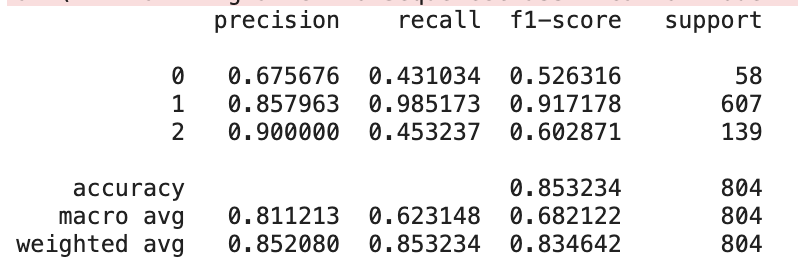

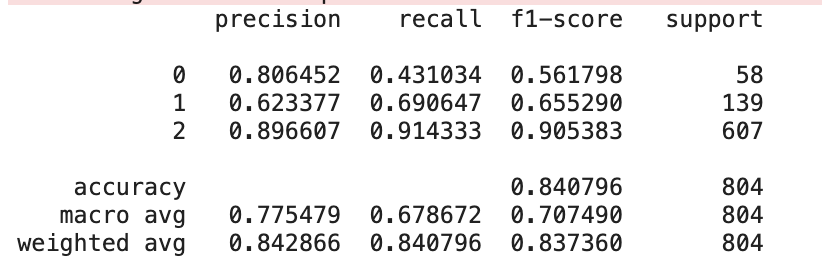

### bertgcn m= 0.5 without dropout
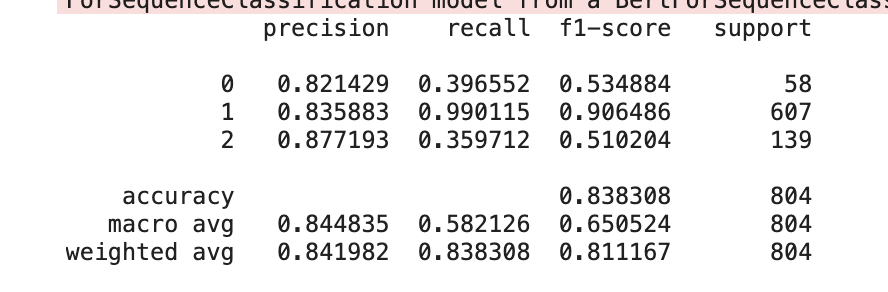

# Results Summary

### Fine Tuned Tagalog BERT

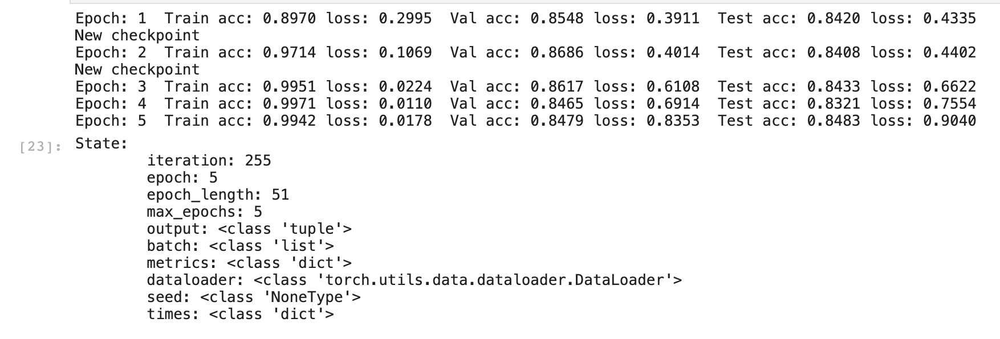

## BertGCN using the fine tuned BERT

### m = 0.7

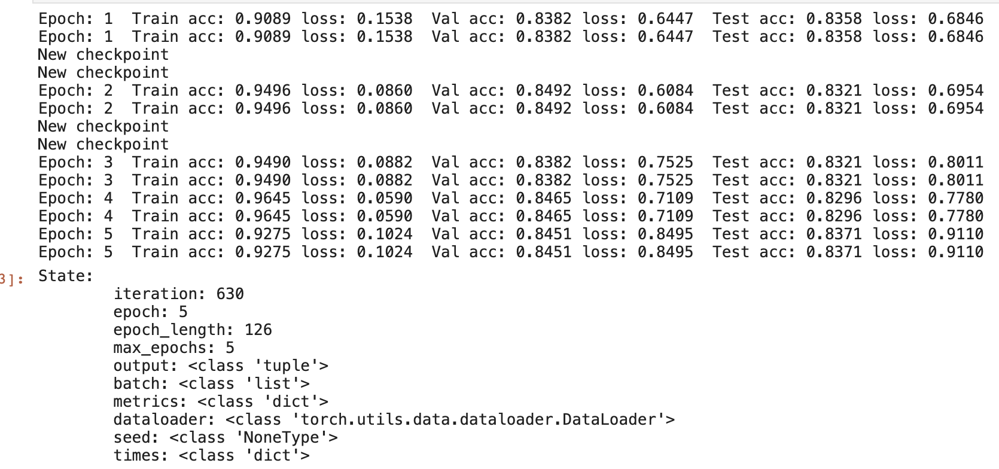

### m = 0.3

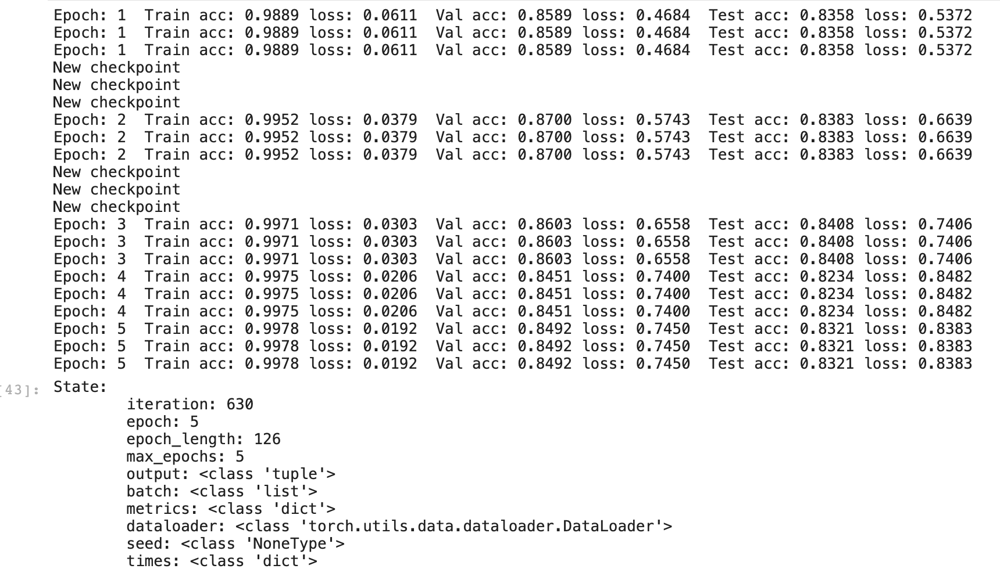

### m = 0.1

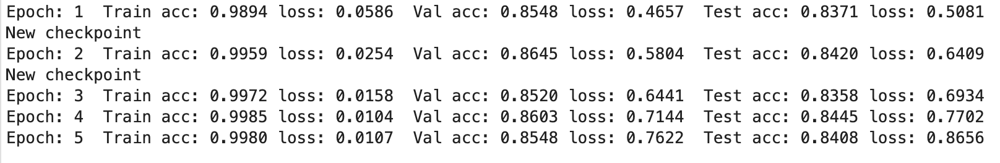

### m = 1

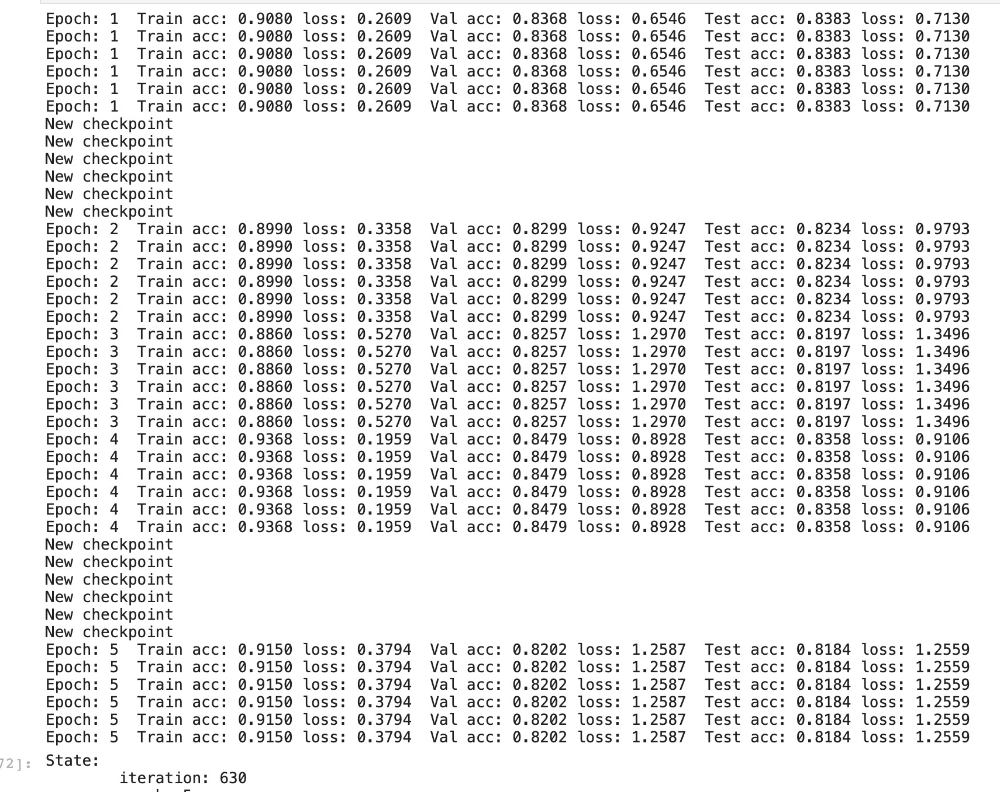

### m = 0.5

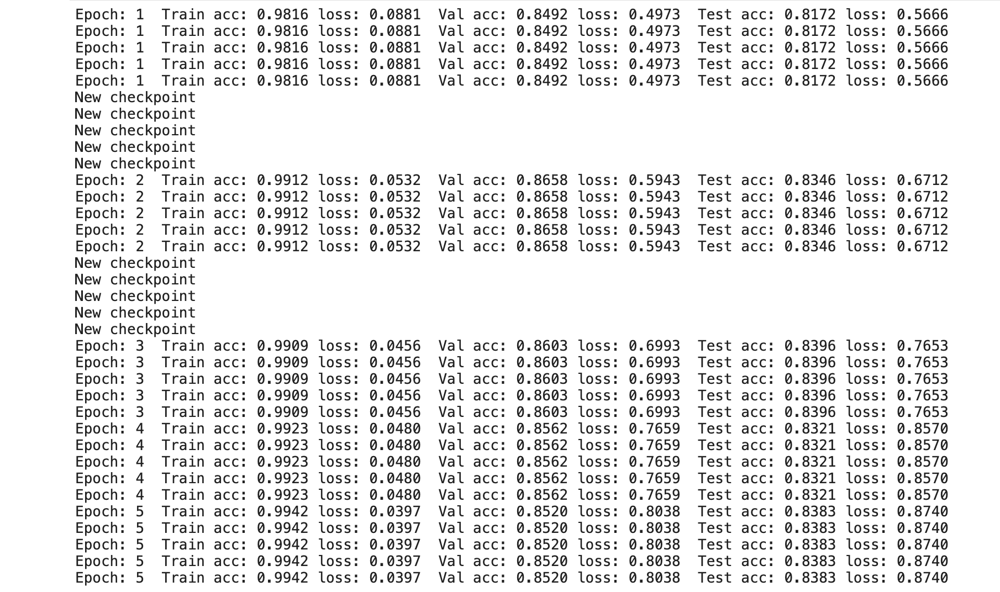

### m = 0.2

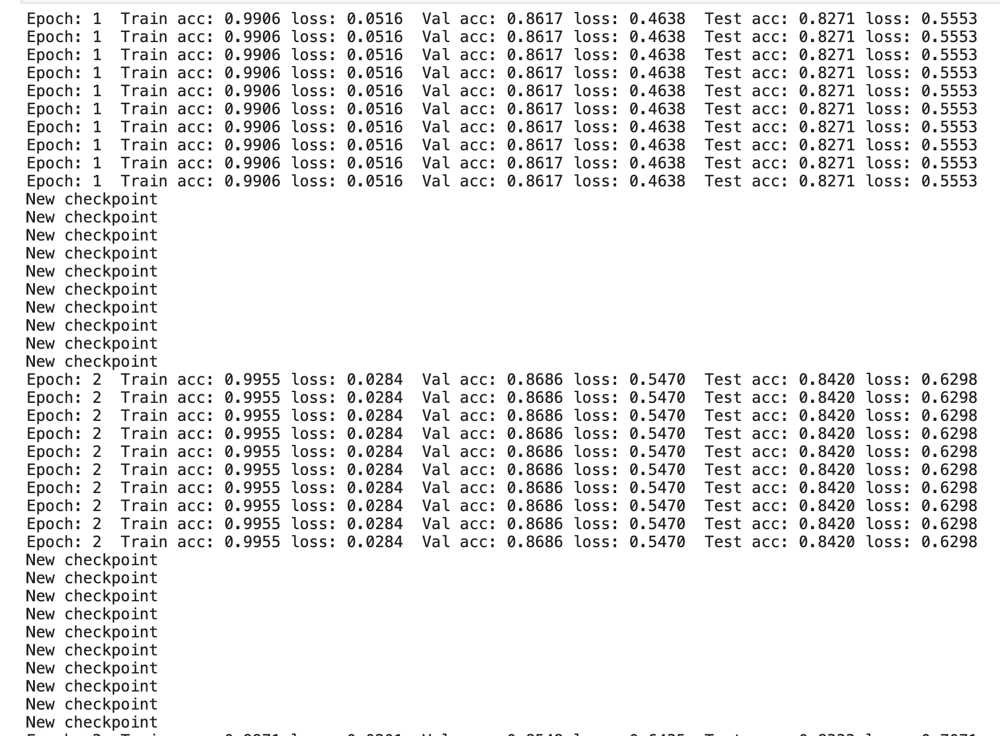

## BertGAT using the fine tuned BERT

### m = 0.7

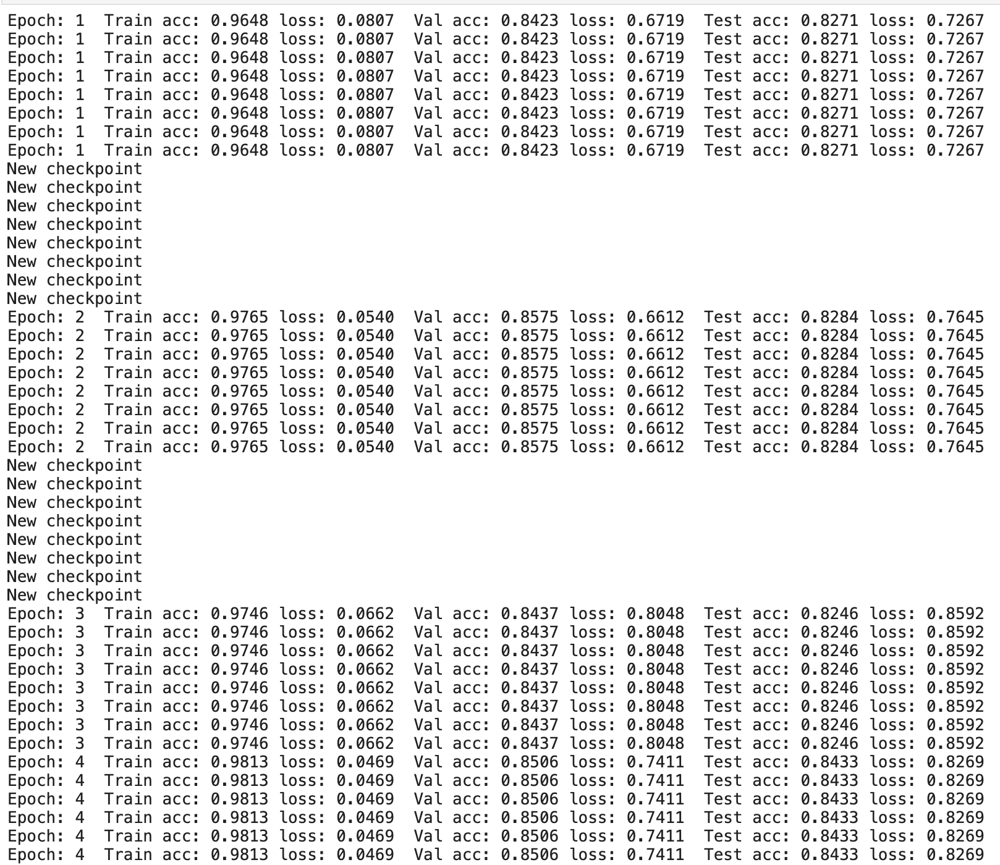

### m = 0.2

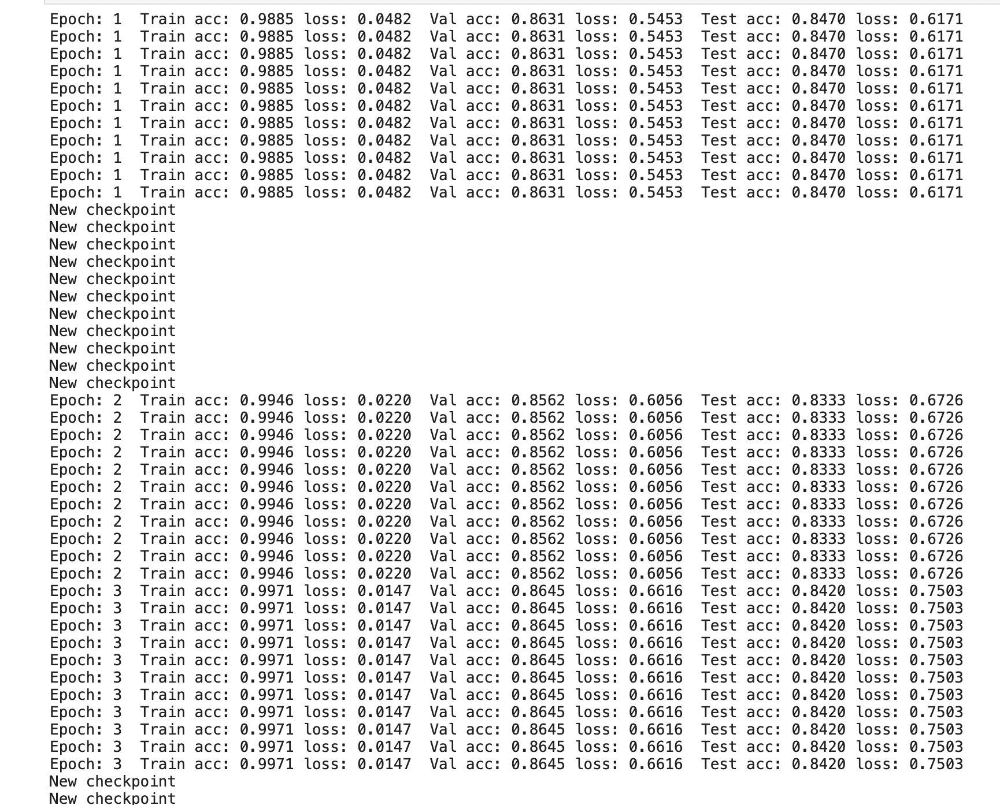

# Fine tuned bert with linear scheduler with warm-up

### fine tuned bert

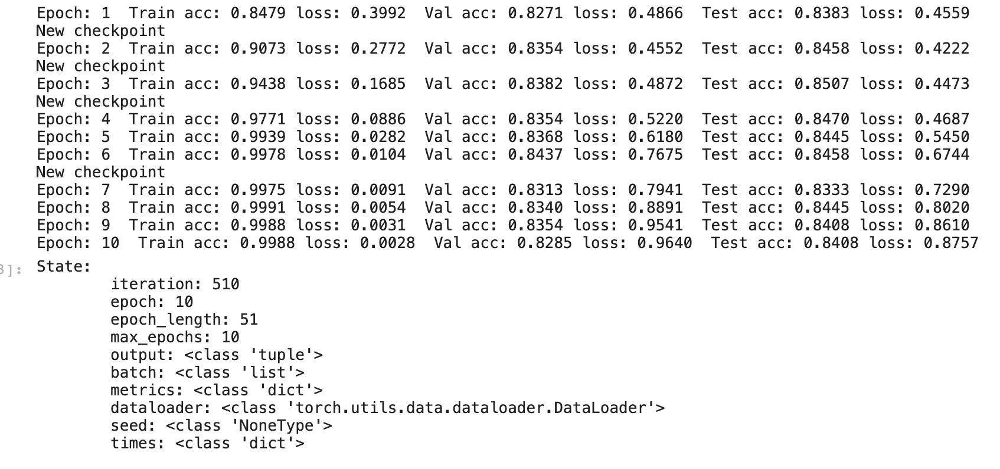

### BERT GCN

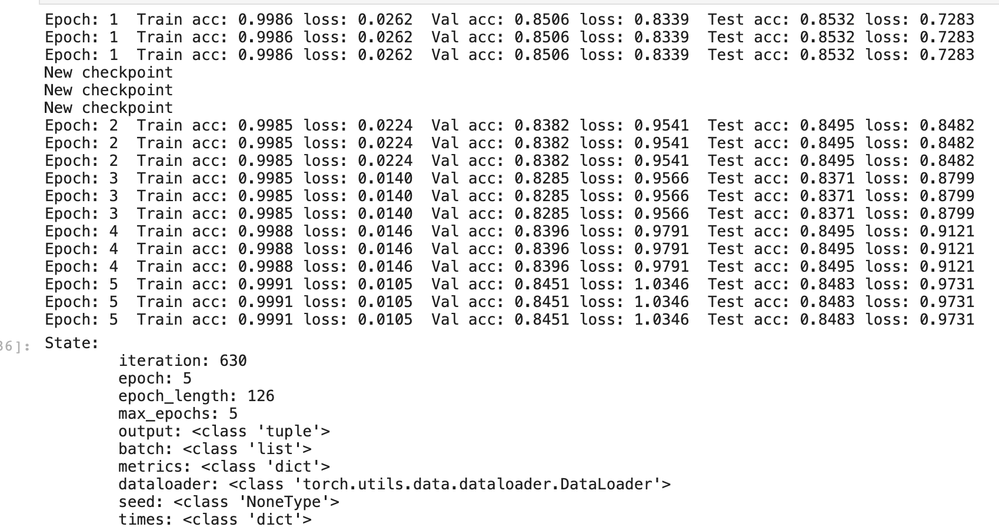

#### learning rate of BERT in the BERTGCN training is 2e-5 not 1e-5
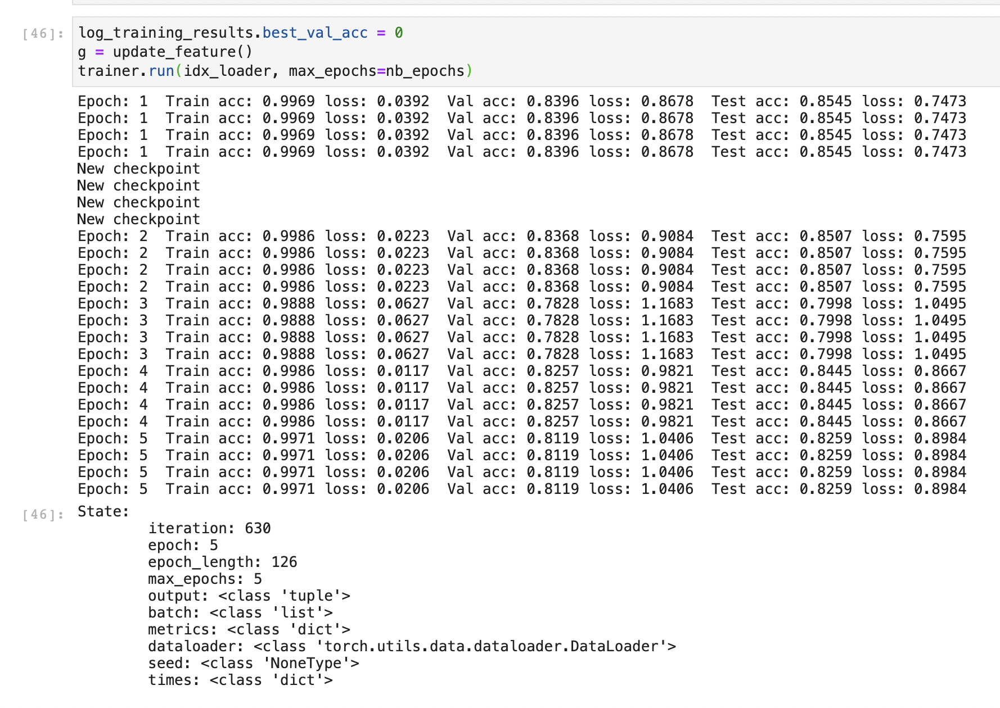

#### used linear scheduler with warm up in bertGCN training
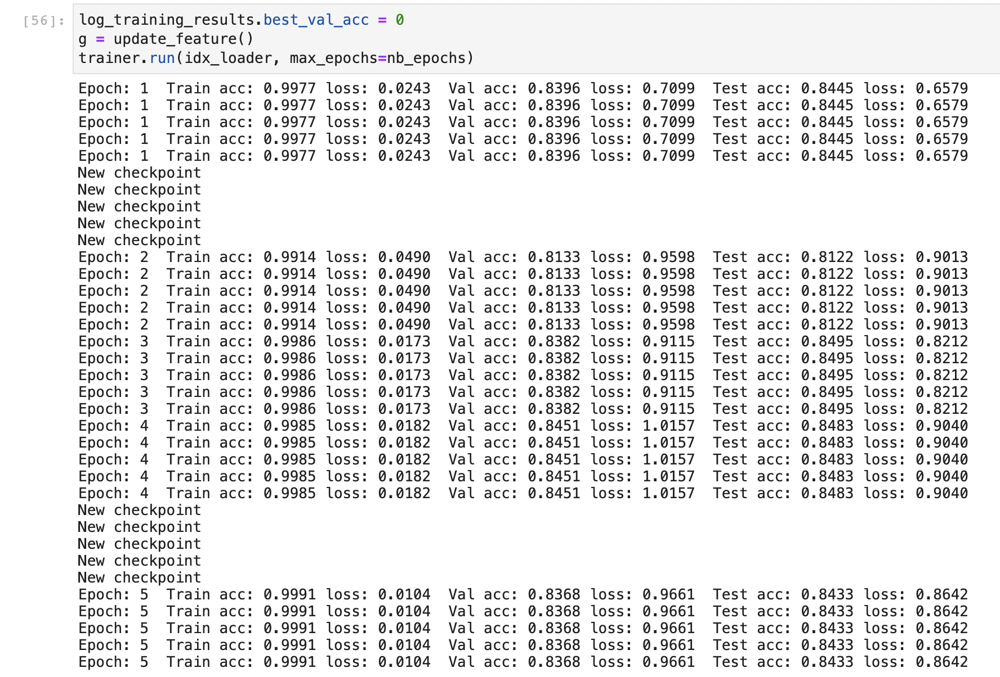